<a href="https://colab.research.google.com/github/aaubs/ds-master/blob/main/notebooks/M1_GeoPandas_Exercises.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install geopandas --q
!pip install contextily --q
!pip install geoplot --q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 1.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx
from shapely.geometry import Point
import geoplot.crs as gcrs
import geoplot as gplt
import pyproj
import folium
from folium import Marker
from folium.plugins import MarkerCluster

In [ ]:
# ! pip install -q kaggle
#  ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle/
# ! chmod 600 ~/.kaggle/kaggle.json

# 1. Get the data

Use the next cell to load the shapefile located at loans_filepath to create a GeoDataFrame world_loans.

In [ ]:
loans_filepath = 'https://raw.githubusercontent.com/aaubs/ds-master/main/data/geopandas_data/kiva_loan.json'

# Your code here: Load the data
world_loans = gpd.read_file(loans_filepath)

# 2. Plot the data

Run the next code cell without changes to load a GeoDataFrame world containing country boundaries.

In [ ]:
# This dataset is provided in GeoPandas
world_filepath = gpd.datasets.get_path('naturalearth_lowres')
world = gpd.read_file(world_filepath)
world.head()

<ipython-input-5-8d5431ffd4fc>:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world_filepath = gpd.datasets.get_path('naturalearth_lowres')


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [ ]:
world_loans.explore()

<Axes: >

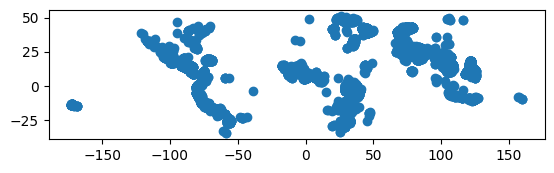

In [ ]:
world_loans.plot()

<Axes: >

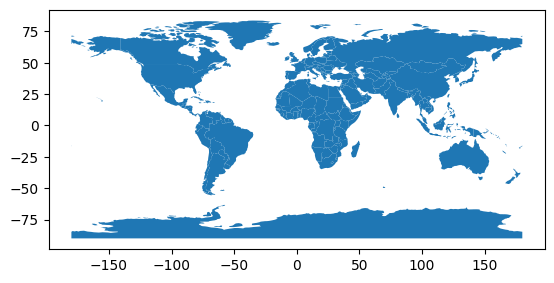

In [ ]:
world.plot()

<Axes: >

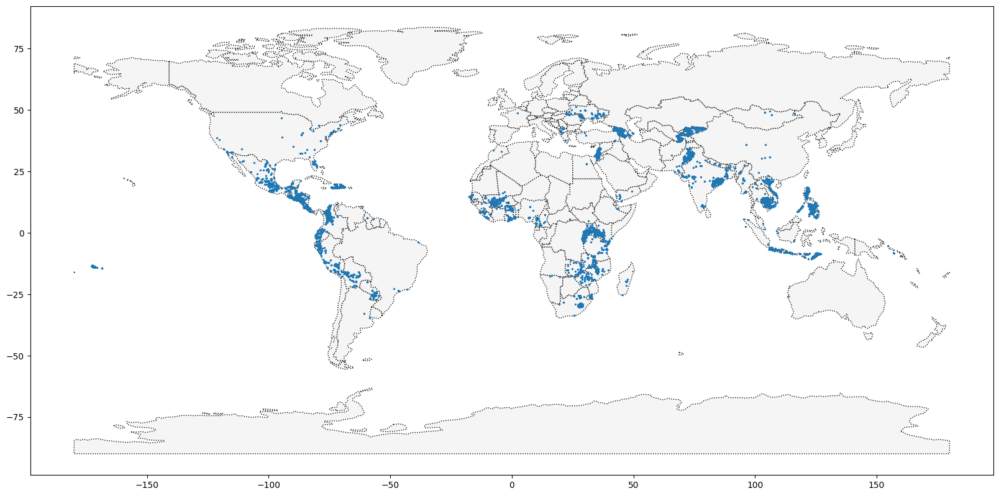

In [ ]:
# Your code here
ax = world.plot(figsize=(20,20), color='whitesmoke', linestyle=':', edgecolor='black')
world_loans.plot(ax=ax, markersize=2)

In [ ]:
# Your code here
# world.explore()


# 3. Select loans based in the Philippines

Next, you'll focus on loans that are based in the Philippines. Use the next code cell to create a GeoDataFrame PHL_loans which contains all rows from world_loans with loans that are based in the Philippines.


In [ ]:
world_loans

,Partner ID,Field Part,sector,Loan Theme,country,amount,geometry
0,9,KREDIT Microfinance Institution,General Financial Inclusion,Higher Education,Cambodia,450,POINT (102.89751 13.66726)
1,9,KREDIT Microfinance Institution,General Financial Inclusion,Vulnerable Populations,Cambodia,20275,POINT (102.98962 13.02870)
2,9,KREDIT Microfinance Institution,General Financial Inclusion,Higher Education,Cambodia,9150,POINT (102.98962 13.02870)
3,9,KREDIT Microfinance Institution,General Financial Inclusion,Vulnerable Populations,Cambodia,604950,POINT (105.31312 12.09829)
4,9,KREDIT Microfinance Institution,General Financial Inclusion,Sanitation,Cambodia,275,POINT (105.31312 12.09829)
...,...,...,...,...,...,...,...
13657,539,"N/A, direct to Sevamob",DSE Direct,Health,South Africa,50000,POINT (29.60355 -25.94599)
13658,540,"N/A, direct to Sanergy",DSE Direct,Water and Sanitation,Kenya,50000,POINT (36.82195 -1.29207)
13659,542,N/A direct to BioLite Inc.,DSE Direct,Clean Cookstove,Uganda,50000,POINT (32.58252 0.34760)
13660,543,N/A direct to LegWorks Inc.,DSE Direct,Health,Canada,50000,POINT (-79.38318 43.65323)


In [ ]:
world_loans.country=="Philippines"

0        False
1        False
2        False
3        False
4        False
         ...  
13657    False
13658    False
13659    False
13660    False
13661    False
Name: country, Length: 13662, dtype: bool

In [ ]:
PHL_loans =  world_loans[world_loans['country']=="Philippines"]

In [ ]:
# Your code here
# PHL_loans = world_loans.loc[world_loans.country=="Philippines"].copy()
PHL_loans.shape

(3083, 7)

In [ ]:
world_loans.country.value_counts().nlargest()

Philippines    3083
Armenia         942
Colombia        822
Mexico          615
Kenya           568
Name: country, dtype: int64

# 4. Understand loans in the Philippines.

Run the next code cell without changes to load a GeoDataFrame PHL containing boundaries for all islands in the Philippines.

In [ ]:
# Load a KML file containing island boundaries
gpd.io.file.fiona.drvsupport.supported_drivers['KML'] = 'rw'
PHL = gpd.read_file("https://github.com/aaubs/ds-master/blob/main/data/geopandas_data/Philippines_AL258.kml?raw=true", driver='KML')
PHL.head()

,Name,Description,geometry
0,Autonomous Region in Muslim Mindanao,,"MULTIPOLYGON (((119.46690 4.58718, 119.46653 4..."
1,Bicol Region,,"MULTIPOLYGON (((124.04577 11.57862, 124.04594 ..."
2,Cagayan Valley,,"MULTIPOLYGON (((122.51581 17.04436, 122.51568 ..."
3,Calabarzon,,"MULTIPOLYGON (((120.49202 14.05403, 120.49201 ..."
4,Caraga,,"MULTIPOLYGON (((126.45401 8.24400, 126.45407 8..."


Use the PHL and PHL_loans GeoDataFrames to visualize loans in the Philippines.


<Axes: >

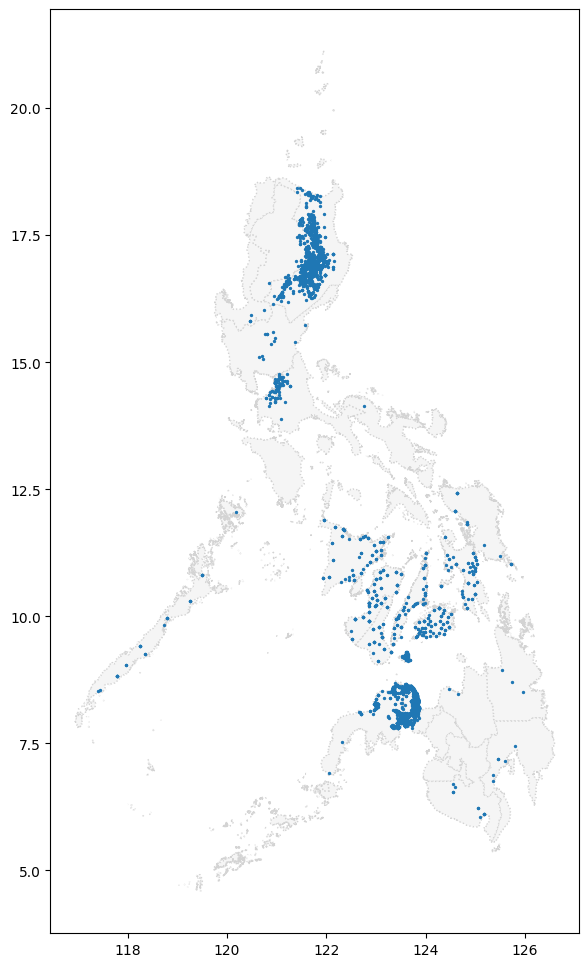

In [ ]:
# Your code here
ax = PHL.plot(figsize=(12,12), color='whitesmoke', linestyle=':', edgecolor='lightgray')
PHL_loans.plot(ax=ax, markersize=2)

# Uncomment to see a hint
#q_4.a.hint()

![image.png](https://raw.githubusercontent.com/aaubs/ds-master/main/data/Images/solution.png)

# 5. Read Starbucks locations in California and filter data for San Francisco



In [ ]:
# Load and preview Starbucks locations in California
starbucks = pd.read_csv("https://raw.githubusercontent.com/aaubs/ds-master/main/data/geopandas_data/starbucks_locations.csv")
starbucks.head()

,Store Number,Store Name,Address,City,Longitude,Latitude
0,10429-100710,Palmdale & Hwy 395,14136 US Hwy 395 Adelanto CA,Adelanto,-117.40,34.51
1,635-352,Kanan & Thousand Oaks,5827 Kanan Road Agoura CA,Agoura,-118.76,34.16
2,74510-27669,Vons-Agoura Hills #2001,5671 Kanan Rd. Agoura Hills CA,Agoura Hills,-118.76,34.15
3,29839-255026,Target Anaheim T-0677,8148 E SANTA ANA CANYON ROAD AHAHEIM CA,AHAHEIM,-117.75,33.87
4,23463-230284,Safeway - Alameda 3281,2600 5th Street Alameda CA,Alameda,-122.28,37.79


In [ ]:
# Create a geometry column from lat and lon

gdf = gpd.GeoDataFrame(starbucks, geometry=gpd.points_from_xy(starbucks.Longitude, starbucks.Latitude))
gdf

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry
0,10429-100710,Palmdale & Hwy 395,14136 US Hwy 395 Adelanto CA,Adelanto,-117.40,34.51,POINT (-117.40000 34.51000)
1,635-352,Kanan & Thousand Oaks,5827 Kanan Road Agoura CA,Agoura,-118.76,34.16,POINT (-118.76000 34.16000)
2,74510-27669,Vons-Agoura Hills #2001,5671 Kanan Rd. Agoura Hills CA,Agoura Hills,-118.76,34.15,POINT (-118.76000 34.15000)
3,29839-255026,Target Anaheim T-0677,8148 E SANTA ANA CANYON ROAD AHAHEIM CA,AHAHEIM,-117.75,33.87,POINT (-117.75000 33.87000)
4,23463-230284,Safeway - Alameda 3281,2600 5th Street Alameda CA,Alameda,-122.28,37.79,POINT (-122.28000 37.79000)
...,...,...,...,...,...,...,...
2816,14071-108147,Hwy 20 & Tharp - Yuba City,"1615 Colusa Hwy, Ste 100 Yuba City CA",Yuba City,-121.64,39.14,POINT (-121.64000 39.14000)
2817,9974-98559,"Yucaipa & Hampton, Yucaipa","31364 Yucaipa Blvd., A Yucaipa CA",Yucaipa,-117.12,34.03,POINT (-117.12000 34.03000)
2818,79654-108478,Vons - Yucaipa #1796,33644 YUCAIPA BLVD YUCAIPA CA,YUCAIPA,-117.07,34.04,POINT (-117.07000 34.04000)
2819,6438-245084,Yucaipa & 6th,"34050 Yucaipa Blvd., 200 Yucaipa CA",Yucaipa,-117.06,34.03,POINT (-117.06000 34.03000)


In [ ]:
# Check geometry column
gdf.geometry

0       POINT (-117.40000 34.51000)
1       POINT (-118.76000 34.16000)
2       POINT (-118.76000 34.15000)
3       POINT (-117.75000 33.87000)
4       POINT (-122.28000 37.79000)
                   ...             
2816    POINT (-121.64000 39.14000)
2817    POINT (-117.12000 34.03000)
2818    POINT (-117.07000 34.04000)
2819    POINT (-117.06000 34.03000)
2820    POINT (-116.40000 34.13000)
Name: geometry, Length: 2821, dtype: geometry

<Axes: >

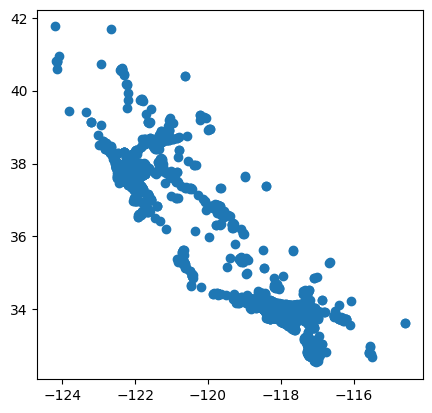

In [ ]:
# Plot data
gdf.plot()

In [ ]:
gdf.shape

(2821, 7)

In [ ]:
gdf[gdf.Longitude.isnull()]

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry
153,5406-945,2224 Shattuck - Berkeley,2224 Shattuck Avenue Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
154,570-512,Solano Ave,1799 Solano Avenue Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
155,17877-164526,Safeway - Berkeley #691,1444 Shattuck Place Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
156,19864-202264,Telegraph & Ashby,3001 Telegraph Avenue Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY
157,9217-9253,2128 Oxford St.,2128 Oxford Street Berkeley CA,Berkeley,NaN,NaN,POINT EMPTY


In [ ]:
# gdf[gdf.Longitude.isnull()]['Longitude']

In [ ]:
gdf.dropna(subset=['Longitude'], inplace=True)

In [ ]:
gdf[gdf.Longitude.isnull()]

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry


In [ ]:
gdf.crs = "epsg:4326"
# SF_starbucks.set_geometry('geometry')
gdf['geometry'].to_crs(epsg='4326')

0       POINT (-117.40000 34.51000)
1       POINT (-118.76000 34.16000)
2       POINT (-118.76000 34.15000)
3       POINT (-117.75000 33.87000)
4       POINT (-122.28000 37.79000)
                   ...             
2816    POINT (-121.64000 39.14000)
2817    POINT (-117.12000 34.03000)
2818    POINT (-117.07000 34.04000)
2819    POINT (-117.06000 34.03000)
2820    POINT (-116.40000 34.13000)
Name: geometry, Length: 2816, dtype: geometry

In [ ]:
gdf.explore()

In [ ]:
gdf.City.value_counts()

San Diego        135
Los Angeles      127
San Francisco     89
San Jose          85
Sacramento        63
                ... 
Mira Loma          1
Mission Hills      1
MISSION VIEJO      1
Monterey Park      1
Yucca Valley       1
Name: City, Length: 529, dtype: int64

In [ ]:
# Filter data for San Francisco
SF_starbucks = gdf.loc[gdf['City'] == "San Francisco"].copy()
SF_starbucks.shape

(89, 7)

In [ ]:
SF_starbucks.crs = "epsg:4326"
# SF_starbucks.set_geometry('geometry')
SF_starbucks['geometry'].to_crs(epsg='4326')

2053    POINT (-122.41000 37.78000)
2054    POINT (-122.43000 37.77000)
2055    POINT (-122.40000 37.78000)
2056    POINT (-122.43000 37.78000)
2057    POINT (-122.48000 37.73000)
                   ...             
2138    POINT (-122.40000 37.78000)
2139    POINT (-122.43000 37.75000)
2140    POINT (-122.39000 37.77000)
2141    POINT (-122.40000 37.79000)
2142    POINT (-122.39000 37.79000)
Name: geometry, Length: 89, dtype: geometry

In [ ]:
# Plot data for San Francisco
SF_starbucks.explore()

![image.png](https://raw.githubusercontent.com/aaubs/ds-master/main/data/Images/solution.png)

# 6. Count the number of starbucks within each neighborhoods in San Francisco

In [ ]:
gdf_neighboor = gpd.read_file('https://raw.githubusercontent.com/aaubs/ds-master/main/data/geopandas_data/SF%20Find%20Neighborhoods.geojson')

In [ ]:
gdf_neighboor.shape

(117, 3)

In [ ]:
gdf_neighboor.head()

,link,name,geometry
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,NaN,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771..."
3,NaN,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710..."
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668..."


In [ ]:
gdf_neighboor.explore()

In [ ]:
SF_starbucks.head()

,Store Number,Store Name,Address,City,Longitude,Latitude,geometry
2053,28316-250007,Teavana - San Francisco Centre,"865 Market St., #324 San Francisco CA",San Francisco,-122.41,37.78,POINT (-122.41000 37.78000)
2054,5396-1025,Church & Market - S.F.,2018 Market Street San Francisco CA,San Francisco,-122.43,37.77,POINT (-122.43000 37.77000)
2055,611-409,120 4th Street,120 4th Street San Francisco CA,San Francisco,-122.40,37.78,POINT (-122.40000 37.78000)
2056,79770-123324,Safeway - San Francisco #995,"1335 Webster, Stonestown Galleria San Francisc...",San Francisco,-122.43,37.78,POINT (-122.43000 37.78000)
2057,28323-250038,Teavana - Stonestown Galleria,"3251 20th Ave., #216 San Francisco CA",San Francisco,-122.48,37.73,POINT (-122.48000 37.73000)


In [ ]:
gdf_neighboor.head()

,link,name,geometry
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937..."
1,NaN,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872..."
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771..."
3,NaN,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710..."
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668..."


In [ ]:
starbucks_count = []
for neighborhood in gdf_neighboor['geometry']:
    starbucks = None
    starbucks = SF_starbucks[SF_starbucks.geometry.within(neighborhood)]
    starbucks_count.append(len(starbucks))

gdf_neighboor['starbucks_count'] = starbucks_count
gdf_neighboor

,link,name,geometry,starbucks_count
0,"http://en.wikipedia.org/wiki/Sea_Cliff,_San_Fr...",Seacliff,"MULTIPOLYGON (((-122.49346 37.78352, -122.4937...",0
1,NaN,Lake Street,"MULTIPOLYGON (((-122.48715 37.78379, -122.4872...",0
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771...",1
3,NaN,Presidio Terrace,"MULTIPOLYGON (((-122.47241 37.78735, -122.4710...",0
4,http://www.sfgate.com/neighborhoods/sf/innerri...,Inner Richmond,"MULTIPOLYGON (((-122.47263 37.78631, -122.4668...",0
...,...,...,...,...
112,"http://en.wikipedia.org/wiki/Corona_Heights,_S...",Corona Heights,"MULTIPOLYGON (((-122.43519 37.76267, -122.4353...",0
113,http://en.wikipedia.org/wiki/Haight-Ashbury,Ashbury Heights,"MULTIPOLYGON (((-122.45196 37.76148, -122.4521...",0
114,"http://en.wikipedia.org/wiki/Eureka_Valley,_Sa...",Eureka Valley,"MULTIPOLYGON (((-122.43734 37.76235, -122.4370...",0
115,"http://en.wikipedia.org/wiki/St._Francis_Wood,...",St. Francis Wood,"MULTIPOLYGON (((-122.47157 37.73471, -122.4683...",0


In [ ]:
gdf_neighboor[gdf_neighboor['starbucks_count'] != 0]

,link,name,geometry,starbucks_count
2,http://www.nps.gov/prsf/index.htm,Presidio National Park,"MULTIPOLYGON (((-122.47758 37.81099, -122.4771...",1
7,http://www.sfgate.com/neighborhoods/sf/outerri...,Outer Richmond,"MULTIPOLYGON (((-122.51316 37.77501, -122.5026...",1
11,"http://en.wikipedia.org/wiki/Lone_Mountain,_Sa...",Lone Mountain,"MULTIPOLYGON (((-122.44728 37.78244, -122.4473...",2
14,NaN,Union Street,"MULTIPOLYGON (((-122.43769 37.79963, -122.4245...",2
16,http://www.sfgate.com/neighborhoods/sf/marina/,Marina,"MULTIPOLYGON (((-122.44432 37.79879, -122.4448...",1
18,http://www.sfgate.com/neighborhoods/sf/unionsq...,Downtown / Union Square,"MULTIPOLYGON (((-122.40238 37.79097, -122.4019...",8
20,"http://en.wikipedia.org/wiki/Civic_Center,_San...",Civic Center,"MULTIPOLYGON (((-122.41251 37.78048, -122.4219...",2
27,"http://en.wikipedia.org/wiki/Duboce_Triangle,_...",Duboce Triangle,"MULTIPOLYGON (((-122.43685 37.77034, -122.4286...",2
29,http://en.wikipedia.org/wiki/Neighborhoods_in_...,Rincon Hill,"MULTIPOLYGON (((-122.38930 37.79139, -122.3888...",4
30,http://en.wikipedia.org/wiki/Neighborhoods_in_...,South Beach,"MULTIPOLYGON (((-122.38452 37.78739, -122.3843...",2


![image.png](https://raw.githubusercontent.com/aaubs/ds-master/main/data/Images/solution.png)

# 7. How far is it from Financial District to other neighborhoods?


In [ ]:
gdf_neighboor['centroid'] = gdf_neighboor.centroid

<ipython-input-42-6d0513e249b9>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_neighboor['centroid'] = gdf_neighboor.centroid


In [ ]:
gdf_neighboor.to_crs(epsg=4326,inplace=True)


In [ ]:
gdf_neighboor.geometry.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
gdf_neighboor[gdf_neighboor['name'] == 'Financial District']

,link,name,geometry,starbucks_count,centroid
107,http://sanfrancisco.about.com/od/neighborhoodp...,Financial District,"MULTIPOLYGON (((-122.40296 37.79378, -122.4033...",19,POINT (-122.39733 37.79262)


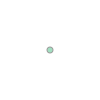

In [ ]:
gdf_neighboor['centroid'][107]

In [ ]:

gdf_neighboor['dist_Financial'] = gdf_neighboor['centroid'].distance(gdf_neighboor['centroid'][107])

<ipython-input-47-3420efefc271>:1: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_neighboor['dist_Financial'] = gdf_neighboor['centroid'].distance(gdf_neighboor['centroid'][107])
